# EDA 4 - Adding 2 Traits: Tancho and GinRin

In [2]:
# imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import json
import seaborn as sns
from IPython.display import Markdown, display

from sklearn.model_selection import train_test_split

In [3]:
# import cleaned df

with open('data/df_cleaned.json', 'r') as f:
  data = json.load(f)

df = pd.DataFrame(data)

In [4]:
# check the dataframe

df.head()

,image_path,tags,uuid,length,price_length,cleaned_price
0,champkoi_data/18f755_A_32_Female_Kohaku_[Nogam...,['Kohaku'],18f755,32.0,7,14000.0
1,gckoi_data/d9a7dbc_HIGH_QUALITY_SAKAI_BLOODLIN...,"['kohaku', 'koi', 'Marukyu', 'nisai']",d9a7dbc,24.0,6,3500.0
2,gckoi_data/88ec869_ISA_KOHAKU_GUARANTEE_FEMALE...,"['isa', 'kohaku', 'koi', 'nisai']",88ec869,21.5,6,2500.0
3,gckoi_data/3a7df4e_DAINICHI_3SAI_FEMALE_KOHAKU...,"['dainichi', 'fall 2024', 'kohaku', 'koi', 'sa...",3a7df4e,27.0,6,3800.0
4,gckoi_data/cb26670_DAINICHI_BLOODLINE_KOHAKU_2...,"['dainichi', 'fall 2024', 'kohaku', 'koi', 'ni...",cb26670,20.0,5,600.0


In [5]:
# check for nulls

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3134 entries, 0 to 3133
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image_path     3134 non-null   object 
 1   tags           3134 non-null   object 
 2   uuid           3134 non-null   object 
 3   length         3134 non-null   float64
 4   price_length   3134 non-null   int64  
 5   cleaned_price  3134 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 147.0+ KB


## Gathering image paths for each of the 3 labels

### 1) Kohaku

In [6]:
# get all the filepaths for 'Kohaku'

kohaku = df[df['tags'].apply(lambda x: 'kohaku' in x or 'Kohaku' in x)].copy()
kohaku

,image_path,tags,uuid,length,price_length,cleaned_price
0,champkoi_data/18f755_A_32_Female_Kohaku_[Nogam...,['Kohaku'],18f755,32.0,7,14000.0
1,gckoi_data/d9a7dbc_HIGH_QUALITY_SAKAI_BLOODLIN...,"['kohaku', 'koi', 'Marukyu', 'nisai']",d9a7dbc,24.0,6,3500.0
2,gckoi_data/88ec869_ISA_KOHAKU_GUARANTEE_FEMALE...,"['isa', 'kohaku', 'koi', 'nisai']",88ec869,21.5,6,2500.0
3,gckoi_data/3a7df4e_DAINICHI_3SAI_FEMALE_KOHAKU...,"['dainichi', 'fall 2024', 'kohaku', 'koi', 'sa...",3a7df4e,27.0,6,3800.0
4,gckoi_data/cb26670_DAINICHI_BLOODLINE_KOHAKU_2...,"['dainichi', 'fall 2024', 'kohaku', 'koi', 'ni...",cb26670,20.0,5,600.0
...,...,...,...,...,...,...
2989,sacramentokoi_data/569caf_Kohaku_21″_–_2412972...,[Kohaku],569caf,21.0,9,3200.0
2990,sacramentokoi_data/d60117_Kohaku_25″_–_2406671...,[Kohaku],d60117,25.0,9,1800.0
3037,sacramentokoi_data/16a8f4_Pearl_Gin_Rin_Kohaku...,"[Pearl, Gin, Rin, Kohaku]",16a8f4,17.0,7,575.0
3107,sacramentokoi_data/bf71be_Tancho_Kohaku_16″_–_...,"[Tancho, Kohaku]",bf71be,16.0,7,550.0


In [7]:
np.floor(np.random.rand(20)*len(kohaku))

array([251., 247.,  95., 209., 236., 194., 256., 196., 167.,  28., 191.,
       217.,  23., 197.,  50., 186., 195., 179., 155., 169.])

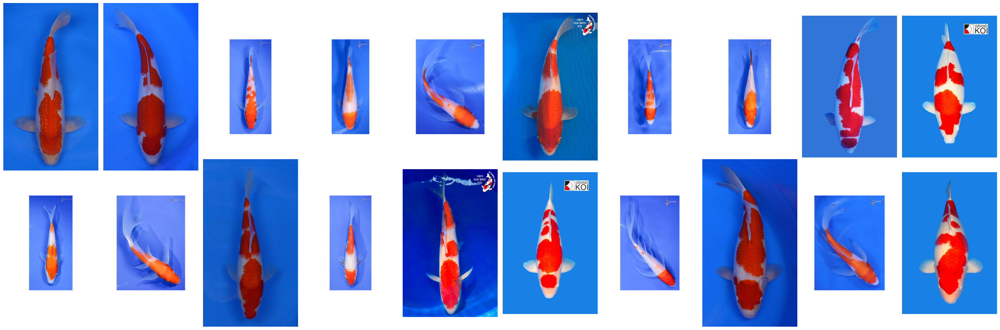

In [8]:
# check random 20 images of Kohaku

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(kohaku))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + kohaku.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.tight_layout()
plt.savefig('graphics/random20_kohaku.png')
plt.show()

### 2) Sanke

In [9]:
# get all the filepaths for 'Sanke'

sanke = df[df['tags'].apply(lambda x: 'Sanke' in x or 'sanke' in x)].copy()
sanke

,image_path,tags,uuid,length,price_length,cleaned_price
7,gckoi_data/743ba36_DAINICHI_BLOODLINE_SHOWA_17...,"['dainichi', 'fall 2024', 'koi', 'nisai', 'san...",743ba36,17.0,5,750.0
22,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.0
23,grandkoi_data/58e2f4_Tancho Sanke.jpeg,"[Tancho, Sanke]",58e2f4,22.0,9,2999.0
59,grandkoi_data/0a839c_Sanke-.jpeg,[Sanke],0a839c,34.0,10,32999.0
157,grandkoi_data/474f2b_Tancho Sanke.jpeg,"[Tancho, Sanke]",474f2b,24.0,9,3499.0
...,...,...,...,...,...,...
3057,sacramentokoi_data/e53be9_Sanke_19″_–_24036325...,[Sanke],e53be9,19.0,7,850.0
3058,sacramentokoi_data/b3d771_Sanke_19″_–_24066224...,[Sanke],b3d771,19.0,9,1900.0
3059,sacramentokoi_data/5146b2_Sanke_20″_–_24036325...,[Sanke],5146b2,20.0,7,900.0
3060,sacramentokoi_data/3a20b7_Sanke_21″_–_24036325...,[Sanke],3a20b7,21.0,9,1200.0


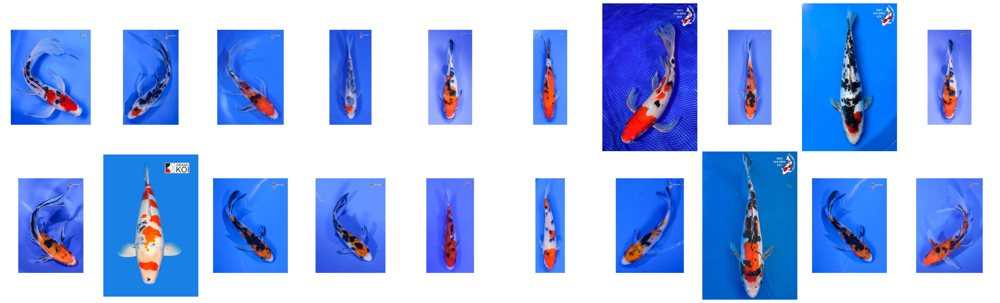

In [10]:
# check random 20 images of sanke

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(sanke))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + sanke.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.tight_layout()
plt.savefig('graphics/random20_sanke.png')
plt.show()

### 3) Showa

In [11]:
# get all the filepaths for 'Showa'

showa = df[df['tags'].apply(lambda x: 'Showa' in x or 'showa' in x)].copy()
showa

,image_path,tags,uuid,length,price_length,cleaned_price
6,gckoi_data/1c880e6_DAINICHI_BLOODLINE_SHOWA_16...,"['dainichi', 'fall 2024', 'koi', 'nisai', 'sho...",1c880e6,16.0,5,750.0
8,gckoi_data/912e50e_DAINICHI_BLOODLINE_TANCHO_S...,"['fall 2024', 'koi', 'nisai', 'showa', 'suzusei']",912e50e,19.0,5,800.0
9,gckoi_data/e9349c2_DANICHI_BLOODLINE_SHOWA_18”...,"['dainichi', 'fall 2024', 'koi', 'nisai', 'sho...",e9349c2,18.0,5,600.0
10,gckoi_data/527c7ac_KOSHIJI_TANCHO_SHOWA_#1.jpg,"['fall 2024', 'koi', 'KOSHIJI', 'nisai', 'showa']",527c7ac,18.0,6,1200.0
12,gckoi_data/d491822_SUPER_RARE_HIGH_QUALITY_ISA...,"['fall 2024', 'isa', 'koi', 'nisai', 'showa']",d491822,18.0,6,3500.0
...,...,...,...,...,...,...
3089,sacramentokoi_data/d32e7b_Showa_21″_–_24033524...,[Showa],d32e7b,21.0,9,1600.0
3090,sacramentokoi_data/705e77_Showa_21″_–_24033525...,[Showa],705e77,21.0,9,1700.0
3091,sacramentokoi_data/68c40e_Showa_21″_–_24107124...,[Showa],68c40e,21.0,9,2300.0
3114,sacramentokoi_data/10e266_Tancho_Showa_15″_–_2...,"[Tancho, Showa]",10e266,15.0,7,375.0


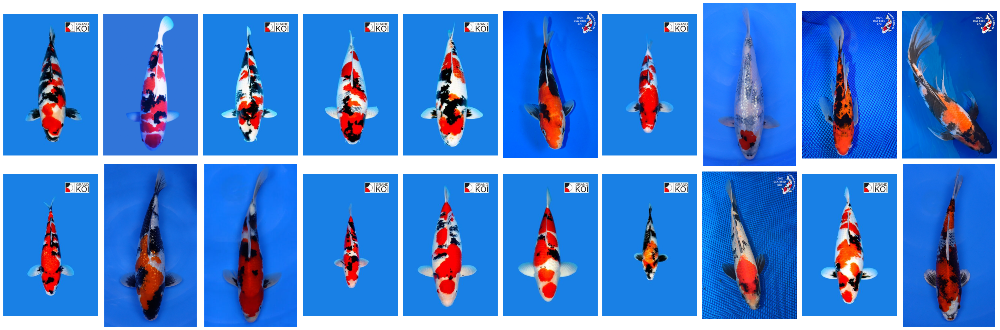

In [12]:
# check random 20 images of showa

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(showa))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + showa.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.tight_layout()
plt.savefig('graphics/random20_showa.png')
plt.show()

### 4) Tancho

In [13]:
# get all the filepaths for 'Tancho'

tancho = df[df['tags'].apply(lambda x: 'Tancho' in x or 'tancho' in x)].copy()
tancho

,image_path,tags,uuid,length,price_length,cleaned_price
22,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.00
23,grandkoi_data/58e2f4_Tancho Sanke.jpeg,"[Tancho, Sanke]",58e2f4,22.0,9,2999.00
24,grandkoi_data/9cd58f_Gin Rin Tancho Goshiki.jpeg,"[Gin, Rin, Tancho, Goshiki]",9cd58f,21.0,9,3999.00
25,grandkoi_data/64c486_Tancho Goshiki.jpeg,"[Tancho, Goshiki]",64c486,26.0,9,4999.00
118,grandkoi_data/a5900a_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",a5900a,22.0,9,4999.00
119,grandkoi_data/9b6b54_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",9b6b54,23.0,9,4999.00
120,grandkoi_data/f9b71b_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",f9b71b,22.0,9,3999.00
121,grandkoi_data/0ab314_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",0ab314,22.0,9,3999.00
122,grandkoi_data/a65473_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",a65473,23.0,9,4999.00
123,grandkoi_data/899484_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",899484,21.0,9,3999.00


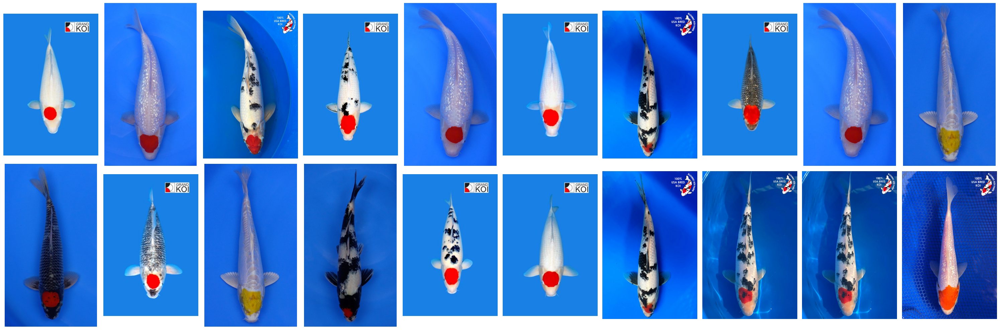

In [14]:
# check random 20 images of tancho

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(tancho))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + tancho.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.tight_layout()
plt.savefig('graphics/random20_tancho.png')
plt.show()

# 5) GinRin

In [15]:
# get all the filepaths for 'Gin'

gin = df[df['tags'].apply(lambda x: 'Gin' in x or 'gin' in x)].copy()
gin

,image_path,tags,uuid,length,price_length,cleaned_price
13,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0
14,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0
18,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0
19,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0
24,grandkoi_data/9cd58f_Gin Rin Tancho Goshiki.jpeg,"[Gin, Rin, Tancho, Goshiki]",9cd58f,21.0,9,3999.0
...,...,...,...,...,...,...
3039,sacramentokoi_data/2871ba_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",2871ba,14.0,7,475.0
3040,sacramentokoi_data/d4398b_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",d4398b,15.0,7,525.0
3041,sacramentokoi_data/dd7ed3_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",dd7ed3,15.0,7,500.0
3042,sacramentokoi_data/11f282_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",11f282,15.0,7,500.0


In [16]:
# get all the filepaths for 'Ginrin'

ginrin = gin[gin['tags'].apply(lambda x: 'Rin' in x or 'rin' in x)].copy()
ginrin

,image_path,tags,uuid,length,price_length,cleaned_price
13,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0
14,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0
18,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0
19,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0
24,grandkoi_data/9cd58f_Gin Rin Tancho Goshiki.jpeg,"[Gin, Rin, Tancho, Goshiki]",9cd58f,21.0,9,3999.0
...,...,...,...,...,...,...
3039,sacramentokoi_data/2871ba_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",2871ba,14.0,7,475.0
3040,sacramentokoi_data/d4398b_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",d4398b,15.0,7,525.0
3041,sacramentokoi_data/dd7ed3_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",dd7ed3,15.0,7,500.0
3042,sacramentokoi_data/11f282_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",11f282,15.0,7,500.0


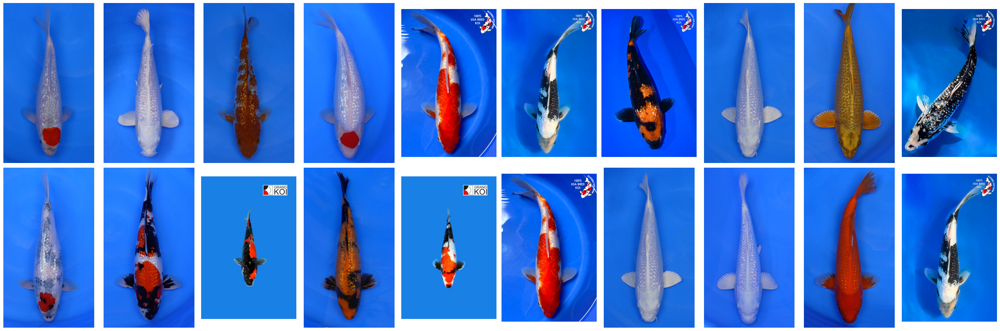

In [17]:
# check random 20 images of ginrin

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(ginrin))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + ginrin.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.savefig('graphics/random20_ginrin.png')
plt.tight_layout()
plt.show()

# Prepare Multi-Label

In [18]:
# get a sample image with multi-label

df.iloc[13]['tags']

['Gin', 'Rin', 'Showa']

In [19]:
# create a new list to collect only the target labels

multi_label = []
labels_list = ['gin', 'rin', 'tancho', 'kohaku', 'showa', 'sanke']
for tag in df.iloc[13]['tags']:
  if tag.lower() in labels_list:
    multi_label.append(tag)

multi_label

['Gin', 'Rin', 'Showa']

In [20]:
# create a function to collect the target labels

def get_target_labels(row):
  multi_label = []
  labels_list = ['gin', 'rin', 'tancho', 'kohaku', 'showa', 'sanke']

  for tag in row['tags']:
    if tag.lower() in labels_list:
      multi_label.append(tag)

  return multi_label

In [21]:
# apply the function to create a new column

df['multi_label'] = df.apply(get_target_labels, axis=1)

In [22]:
# filter the dataframe with only images that do not have empty multi_label

df['not_empty'] = df['multi_label'].apply(lambda x: x!=[])

In [23]:
df = df[df['not_empty']]
df

,image_path,tags,uuid,length,price_length,cleaned_price,multi_label,not_empty
13,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0,"[Gin, Rin, Showa]",True
14,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0,"[Gin, Rin, showa]",True
18,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0,"[Gin, Rin]",True
19,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0,"[Gin, Rin]",True
22,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.0,"[Tancho, Sanke]",True
...,...,...,...,...,...,...,...,...
3111,sacramentokoi_data/83d8dc_Tancho_Ochiba_14″_–_...,"[Tancho, Ochiba]",83d8dc,14.0,7,375.0,[Tancho],True
3112,sacramentokoi_data/0e4681_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",0e4681,20.0,7,950.0,[Tancho],True
3113,sacramentokoi_data/84af0c_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",84af0c,22.0,9,2100.0,[Tancho],True
3114,sacramentokoi_data/10e266_Tancho_Showa_15″_–_2...,"[Tancho, Showa]",10e266,15.0,7,375.0,"[Tancho, Showa]",True


In [24]:
df['not_empty'].value_counts()

not_empty
True    859
Name: count, dtype: int64

In [25]:
# export dataset to json

# with open('data/df_5labels.json', 'w') as f:
#   json.dump(df.to_dict(orient='records'), f)

# EDA

In [26]:
# check the class balance

class_balance = {'kohaku': len(kohaku), 'sanke': len(sanke), 'showa': len(showa), 'tancho': len(tancho), 'ginrin': len(ginrin)}
class_balance

{'kohaku': 264, 'sanke': 237, 'showa': 185, 'tancho': 60, 'ginrin': 261}

In [27]:
# turn the dictionary into a dataframe

class_balance_df = pd.DataFrame({'class': class_balance.keys(), 'count': class_balance.values()})
class_balance_df = class_balance_df.sort_values(by='count', ascending=False)

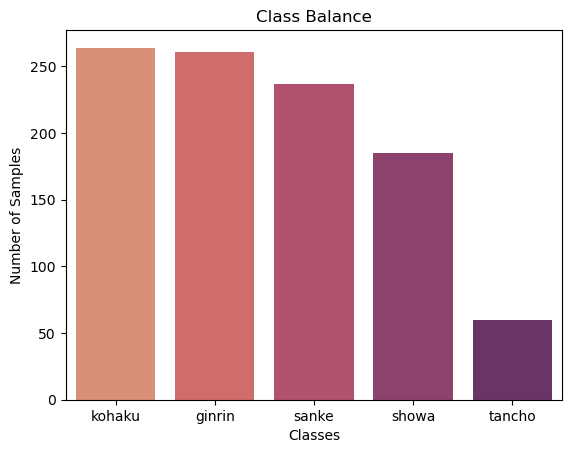

In [28]:
# plot the class counts

sns.barplot(x=class_balance_df['class'], y=class_balance_df['count'], hue=class_balance_df['class'], palette='flare')
plt.title('Class Balance')
plt.xlabel('Classes')
plt.ylabel('Number of Samples')
plt.savefig('graphics/class_balance_5classes.png', transparent=True);

- Tancho is a rarer class than the other four classes, I will balance classes during modeling.

In [29]:
# Gin and Rin are combined into 1 class, remove 'Rin' from labels list

labels_list.remove('rin')
labels_list

['gin', 'tancho', 'kohaku', 'showa', 'sanke']

In [30]:
# For each observation count how many tags are in the labels_list

num_labels = []

for _, row in df.iterrows():
  counter = 0
  for label in labels_list:
    if label in [x.lower() for x in row['multi_label']]:
      counter += 1
  num_labels.append(counter)

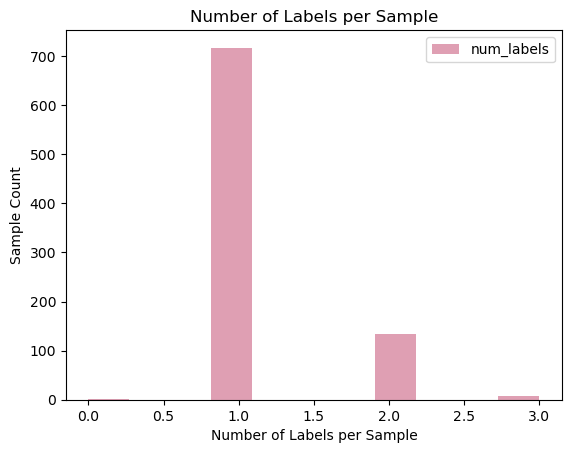

In [31]:
# Use a histogram to see the distribution of how many labels each picture has

num_labels_df = pd.DataFrame({'num_labels': num_labels})

sns.histplot(num_labels_df, palette='flare', edgecolor=None)
plt.title('Number of Labels per Sample')
plt.xlabel('Number of Labels per Sample')
plt.ylabel('Sample Count')
plt.savefig('graphics/num_labels_per_sample_hist.png', transparent=True);

In [32]:
# Create separate price columns for each label
df_labeled_price = pd.merge(df, ginrin[['uuid','cleaned_price']].rename(columns={'cleaned_price': 'ginrin'}), how='left', on='uuid')
df_labeled_price = pd.merge(df_labeled_price, tancho[['uuid','cleaned_price']].rename(columns={'cleaned_price': 'tancho'}), how='left', on='uuid')
df_labeled_price = pd.merge(df_labeled_price, kohaku[['uuid','cleaned_price']].rename(columns={'cleaned_price': 'kohaku'}), how='left', on='uuid')
df_labeled_price = pd.merge(df_labeled_price, sanke[['uuid','cleaned_price']].rename(columns={'cleaned_price': 'sanke'}), how='left', on='uuid')
df_labeled_price = pd.merge(df_labeled_price, showa[['uuid','cleaned_price']].rename(columns={'cleaned_price': 'showa'}), how='left', on='uuid')

df_labeled_price.head()

,image_path,tags,uuid,length,price_length,cleaned_price,multi_label,not_empty,ginrin,tancho,kohaku,sanke,showa
0,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0,"[Gin, Rin, Showa]",True,34999.0,NaN,NaN,NaN,34999.0
1,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0,"[Gin, Rin, showa]",True,34999.0,NaN,NaN,NaN,34999.0
2,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0,"[Gin, Rin]",True,6999.0,NaN,NaN,NaN,NaN
3,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0,"[Gin, Rin]",True,4999.0,NaN,NaN,NaN,NaN
4,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.0,"[Tancho, Sanke]",True,NaN,3499.0,NaN,3499.0,NaN


In [33]:
# Create binary columns for each label
df_labeled_price['b_ginrin'] = df_labeled_price['ginrin'].apply(lambda x: 0 if pd.isnull(x) else 1)
df_labeled_price['b_tancho'] = df_labeled_price['tancho'].apply(lambda x: 0 if pd.isnull(x) else 1)
df_labeled_price['b_kohaku'] = df_labeled_price['kohaku'].apply(lambda x: 0 if pd.isnull(x) else 1)
df_labeled_price['b_sanke'] = df_labeled_price['sanke'].apply(lambda x: 0 if pd.isnull(x) else 1)
df_labeled_price['b_showa'] = df_labeled_price['showa'].apply(lambda x: 0 if pd.isnull(x) else 1)

df_labeled_price

,image_path,tags,uuid,length,price_length,cleaned_price,multi_label,not_empty,ginrin,tancho,kohaku,sanke,showa,b_ginrin,b_tancho,b_kohaku,b_sanke,b_showa
0,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0,"[Gin, Rin, Showa]",True,34999.0,NaN,NaN,NaN,34999.0,1,0,0,0,1
1,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0,"[Gin, Rin, showa]",True,34999.0,NaN,NaN,NaN,34999.0,1,0,0,0,1
2,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0,"[Gin, Rin]",True,6999.0,NaN,NaN,NaN,NaN,1,0,0,0,0
3,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0,"[Gin, Rin]",True,4999.0,NaN,NaN,NaN,NaN,1,0,0,0,0
4,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.0,"[Tancho, Sanke]",True,NaN,3499.0,NaN,3499.0,NaN,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
854,sacramentokoi_data/83d8dc_Tancho_Ochiba_14″_–_...,"[Tancho, Ochiba]",83d8dc,14.0,7,375.0,[Tancho],True,NaN,375.0,NaN,NaN,NaN,0,1,0,0,0
855,sacramentokoi_data/0e4681_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",0e4681,20.0,7,950.0,[Tancho],True,NaN,950.0,NaN,NaN,NaN,0,1,0,0,0
856,sacramentokoi_data/84af0c_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",84af0c,22.0,9,2100.0,[Tancho],True,NaN,2100.0,NaN,NaN,NaN,0,1,0,0,0
857,sacramentokoi_data/10e266_Tancho_Showa_15″_–_2...,"[Tancho, Showa]",10e266,15.0,7,375.0,"[Tancho, Showa]",True,NaN,375.0,NaN,NaN,375.0,0,1,0,0,1


In [34]:
# Create a new column for the variety of the fish
def get_variety(row):
  if row['b_kohaku'] == 1:
    return 'kohaku'
  elif row['b_sanke'] == 1:
    return 'sanke'
  elif row['b_showa'] == 1:
    return 'showa'
  else:
    return np.nan

df_labeled_price['variety'] = df_labeled_price.apply(get_variety, axis=1)
df_labeled_price

,image_path,tags,uuid,length,price_length,cleaned_price,multi_label,not_empty,ginrin,tancho,kohaku,sanke,showa,b_ginrin,b_tancho,b_kohaku,b_sanke,b_showa,variety
0,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0,"[Gin, Rin, Showa]",True,34999.0,NaN,NaN,NaN,34999.0,1,0,0,0,1,showa
1,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0,"[Gin, Rin, showa]",True,34999.0,NaN,NaN,NaN,34999.0,1,0,0,0,1,showa
2,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0,"[Gin, Rin]",True,6999.0,NaN,NaN,NaN,NaN,1,0,0,0,0,NaN
3,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0,"[Gin, Rin]",True,4999.0,NaN,NaN,NaN,NaN,1,0,0,0,0,NaN
4,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.0,"[Tancho, Sanke]",True,NaN,3499.0,NaN,3499.0,NaN,0,1,0,1,0,sanke
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
854,sacramentokoi_data/83d8dc_Tancho_Ochiba_14″_–_...,"[Tancho, Ochiba]",83d8dc,14.0,7,375.0,[Tancho],True,NaN,375.0,NaN,NaN,NaN,0,1,0,0,0,NaN
855,sacramentokoi_data/0e4681_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",0e4681,20.0,7,950.0,[Tancho],True,NaN,950.0,NaN,NaN,NaN,0,1,0,0,0,NaN
856,sacramentokoi_data/84af0c_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",84af0c,22.0,9,2100.0,[Tancho],True,NaN,2100.0,NaN,NaN,NaN,0,1,0,0,0,NaN
857,sacramentokoi_data/10e266_Tancho_Showa_15″_–_2...,"[Tancho, Showa]",10e266,15.0,7,375.0,"[Tancho, Showa]",True,NaN,375.0,NaN,NaN,375.0,0,1,0,0,1,showa


In [35]:
# Create a column that indicates the presence of a trait
def get_trait(row):
  if row['b_tancho'] == 1 or row['b_ginrin'] == 1:
    return True
  else:
    return False

df_labeled_price['trait'] = df_labeled_price.apply(get_trait, axis=1)
df_labeled_price

,image_path,tags,uuid,length,price_length,cleaned_price,multi_label,not_empty,ginrin,tancho,kohaku,sanke,showa,b_ginrin,b_tancho,b_kohaku,b_sanke,b_showa,variety,trait
0,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0,"[Gin, Rin, Showa]",True,34999.0,NaN,NaN,NaN,34999.0,1,0,0,0,1,showa,True
1,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0,"[Gin, Rin, showa]",True,34999.0,NaN,NaN,NaN,34999.0,1,0,0,0,1,showa,True
2,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0,"[Gin, Rin]",True,6999.0,NaN,NaN,NaN,NaN,1,0,0,0,0,NaN,True
3,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0,"[Gin, Rin]",True,4999.0,NaN,NaN,NaN,NaN,1,0,0,0,0,NaN,True
4,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.0,"[Tancho, Sanke]",True,NaN,3499.0,NaN,3499.0,NaN,0,1,0,1,0,sanke,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
854,sacramentokoi_data/83d8dc_Tancho_Ochiba_14″_–_...,"[Tancho, Ochiba]",83d8dc,14.0,7,375.0,[Tancho],True,NaN,375.0,NaN,NaN,NaN,0,1,0,0,0,NaN,True
855,sacramentokoi_data/0e4681_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",0e4681,20.0,7,950.0,[Tancho],True,NaN,950.0,NaN,NaN,NaN,0,1,0,0,0,NaN,True
856,sacramentokoi_data/84af0c_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",84af0c,22.0,9,2100.0,[Tancho],True,NaN,2100.0,NaN,NaN,NaN,0,1,0,0,0,NaN,True
857,sacramentokoi_data/10e266_Tancho_Showa_15″_–_2...,"[Tancho, Showa]",10e266,15.0,7,375.0,"[Tancho, Showa]",True,NaN,375.0,NaN,NaN,375.0,0,1,0,0,1,showa,True


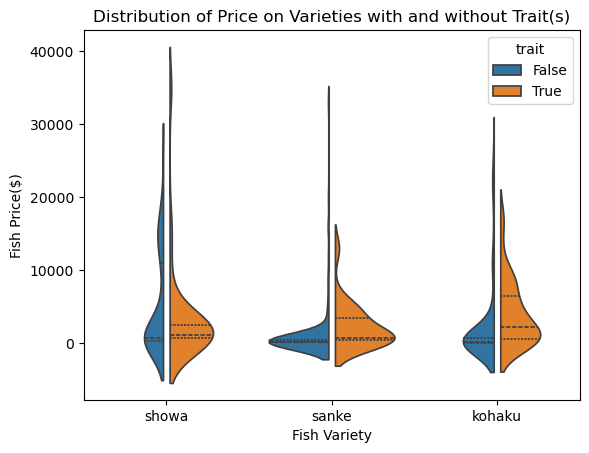

In [36]:
# Plot the distribution of prices for each variety with and without traits
sns.violinplot(data=df_labeled_price, x="variety", y="cleaned_price", hue="trait", split=True, gap=.1, inner="quart")
plt.xlabel('Fish Variety')
plt.ylabel('Fish Price($)')
plt.title('Distribution of Price on Varieties with and without Trait(s)');

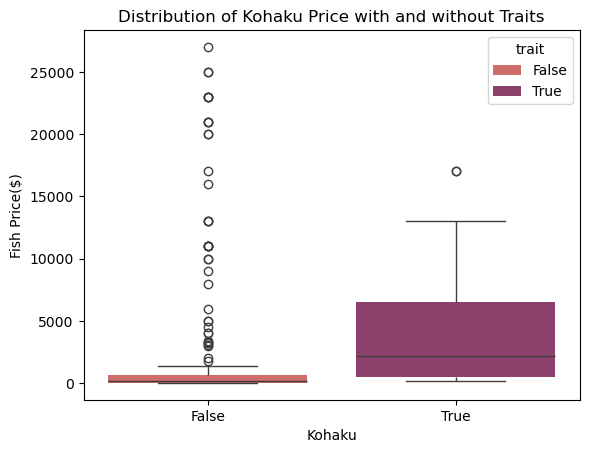

In [37]:
# Plot the distribution of prices for varieties with and without traits(s)
sns.boxplot(data=df_labeled_price[['kohaku','trait']], x="trait", y="kohaku", hue="trait", palette='flare', boxprops=dict(edgecolor='none'))
plt.xlabel('Kohaku')
plt.ylabel('Fish Price($)')
plt.title('Distribution of Kohaku Price with and without Traits')
plt.savefig('graphics/kohaku_with_wo_traits.png', transparent=True);

In [38]:
# Check how having a trait and not having a trait affects the distribution of price for Kohaku variety
df_labeled_price[['trait','kohaku']].groupby('trait').describe().T

trait                False         True 
kohaku count    211.000000     47.000000
       mean    2471.151422   4030.359574
       std     5837.288654   4392.080882
       min       26.600000    149.990000
       25%       49.000000    524.995000
       50%      145.000000   2200.000000
       75%      649.995000   6499.000000
       max    26999.000000  16999.000000

In [39]:
# Create a dataframe that includes kohaku only for plotting
kohaku_df = df_labeled_price[df_labeled_price['b_kohaku']==1]
kohaku_df

,image_path,tags,uuid,length,price_length,cleaned_price,multi_label,not_empty,ginrin,tancho,kohaku,sanke,showa,b_ginrin,b_tancho,b_kohaku,b_sanke,b_showa,variety,trait
32,grandkoi_data/c424bc_Kohaku.jpeg,[Kohaku],c424bc,28.0,9,9999.0,[Kohaku],True,NaN,NaN,9999.0,NaN,NaN,0,0,1,0,0,kohaku,False
50,grandkoi_data/f25237_Kohaku.jpeg,[Kohaku],f25237,29.0,10,15999.0,[Kohaku],True,NaN,NaN,15999.0,NaN,NaN,0,0,1,0,0,kohaku,False
51,grandkoi_data/cebd0a_Kohaku.jpeg,[Kohaku],cebd0a,31.0,10,20999.0,[Kohaku],True,NaN,NaN,20999.0,NaN,NaN,0,0,1,0,0,kohaku,False
52,grandkoi_data/54fe41_Kohaku.jpeg,[Kohaku],54fe41,30.0,10,19999.0,[Kohaku],True,NaN,NaN,19999.0,NaN,NaN,0,0,1,0,0,kohaku,False
53,grandkoi_data/232047_Kohaku.jpeg,[Kohaku],232047,32.0,10,22999.0,[Kohaku],True,NaN,NaN,22999.0,NaN,NaN,0,0,1,0,0,kohaku,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
800,sacramentokoi_data/569caf_Kohaku_21″_–_2412972...,[Kohaku],569caf,21.0,9,3200.0,[Kohaku],True,NaN,NaN,3200.0,NaN,NaN,0,0,1,0,0,kohaku,False
801,sacramentokoi_data/d60117_Kohaku_25″_–_2406671...,[Kohaku],d60117,25.0,9,1800.0,[Kohaku],True,NaN,NaN,1800.0,NaN,NaN,0,0,1,0,0,kohaku,False
808,sacramentokoi_data/16a8f4_Pearl_Gin_Rin_Kohaku...,"[Pearl, Gin, Rin, Kohaku]",16a8f4,17.0,7,575.0,"[Gin, Rin, Kohaku]",True,575.0,NaN,575.0,NaN,NaN,1,0,1,0,0,kohaku,True
850,sacramentokoi_data/bf71be_Tancho_Kohaku_16″_–_...,"[Tancho, Kohaku]",bf71be,16.0,7,550.0,"[Tancho, Kohaku]",True,NaN,550.0,550.0,NaN,NaN,0,1,1,0,0,kohaku,True


<Axes: xlabel='cleaned_price'>

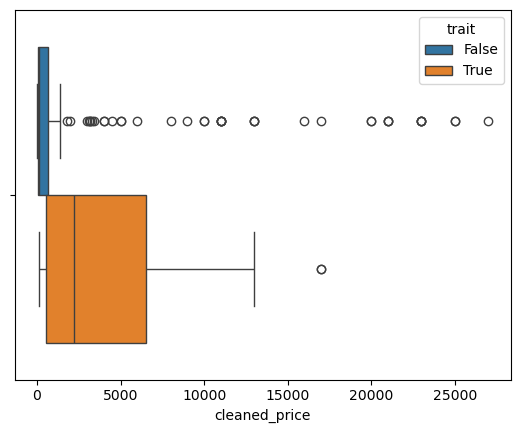

In [40]:
# Plot the box and whiskers to check the difference in distribution of price.
sns.boxplot(data=kohaku_df, x='cleaned_price', hue='trait')

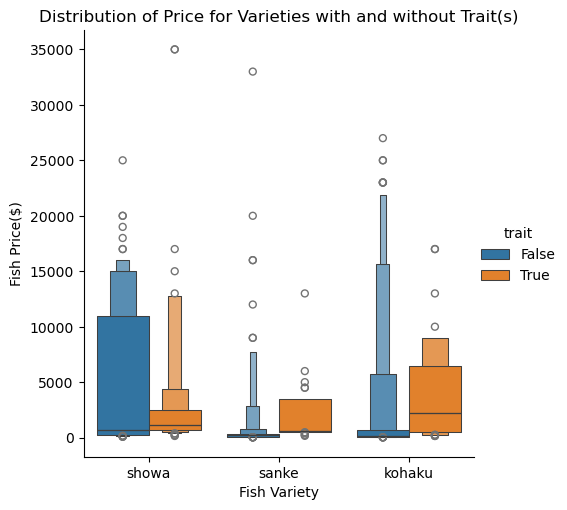

In [41]:
# Plot the distribution of prices for varieties with and without traits(s)
sns.catplot(data=df_labeled_price, x="variety", y="cleaned_price", hue="trait", kind='boxen')
plt.xlabel('Fish Variety')
plt.ylabel('Fish Price($)')
plt.title('Distribution of Price for Varieties with and without Trait(s)');

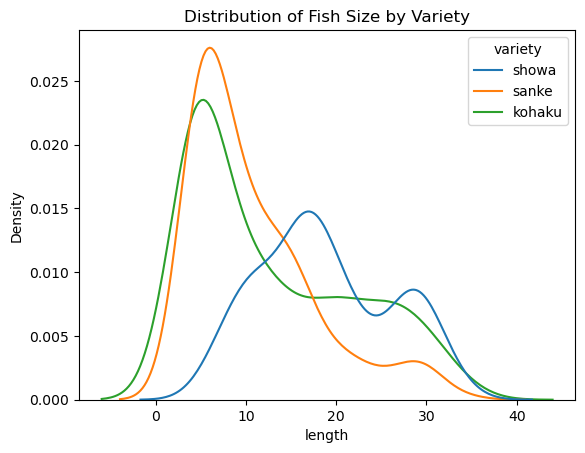

In [42]:
# Plot the distribution of fish size by variety
sns.kdeplot(data=df_labeled_price, x="length", hue="variety")
plt.title('Distribution of Fish Size by Variety');

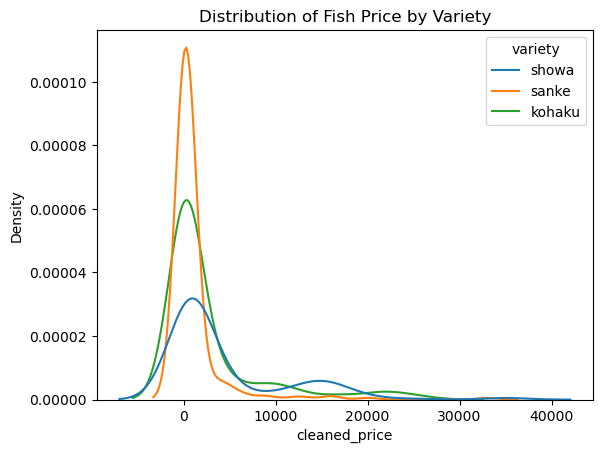

In [43]:
# Plot the distribution of fish price by variety
sns.kdeplot(data=df_labeled_price, x="cleaned_price", hue="variety")
plt.title('Distribution of Fish Price by Variety');

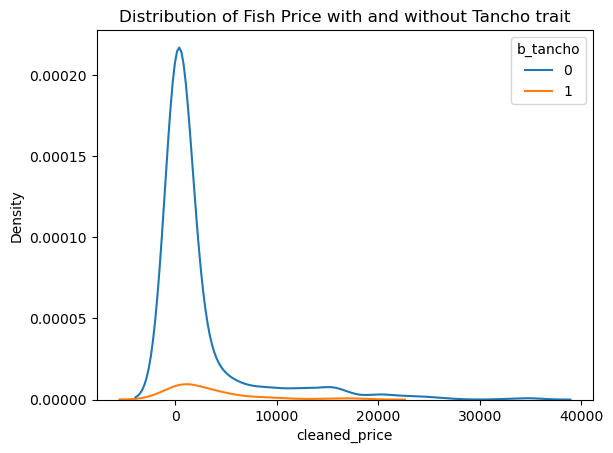

In [44]:
# Plot the distribution of fish price by Tancho trait
sns.kdeplot(data=df_labeled_price, x="cleaned_price", hue="b_tancho")
plt.title('Distribution of Fish Price with and without Tancho trait');

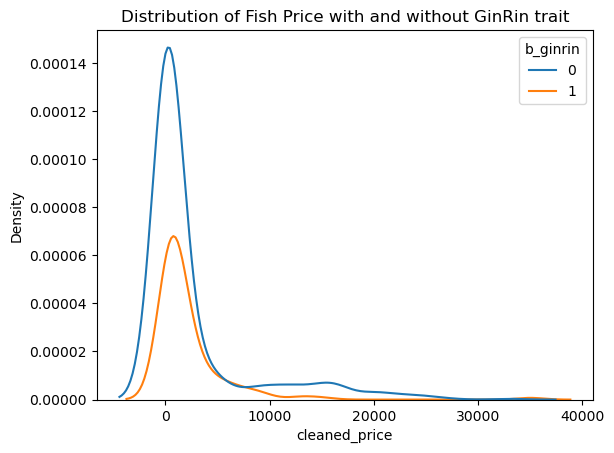

In [45]:
# Plot the distribution of fish price by GinRin trait
sns.kdeplot(data=df_labeled_price, x="cleaned_price", hue="b_ginrin")
plt.title('Distribution of Fish Price with and without GinRin trait');

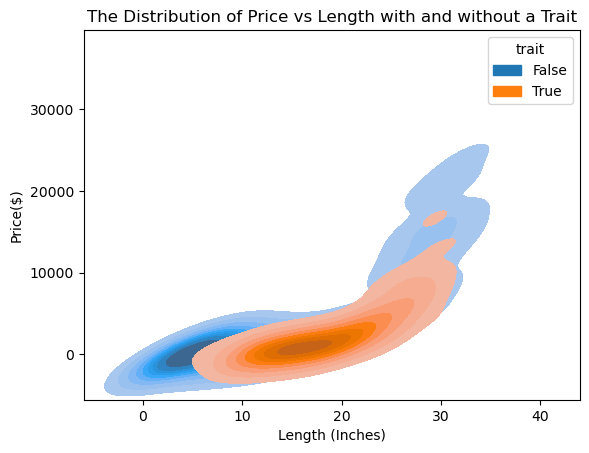

In [46]:
# How does having a trait in combination with the size of the fish, affect the price?
sns.kdeplot(data=df_labeled_price, x="length", y="cleaned_price", hue="trait", fill=True)
plt.title('The Distribution of Price vs Length with and without a Trait')
plt.xlabel('Length (Inches)')
plt.ylabel('Price($)');

#### How Having a Trait affect Distribution of Prices on Different Varieties on medium-priced fish ($500-$25,000)

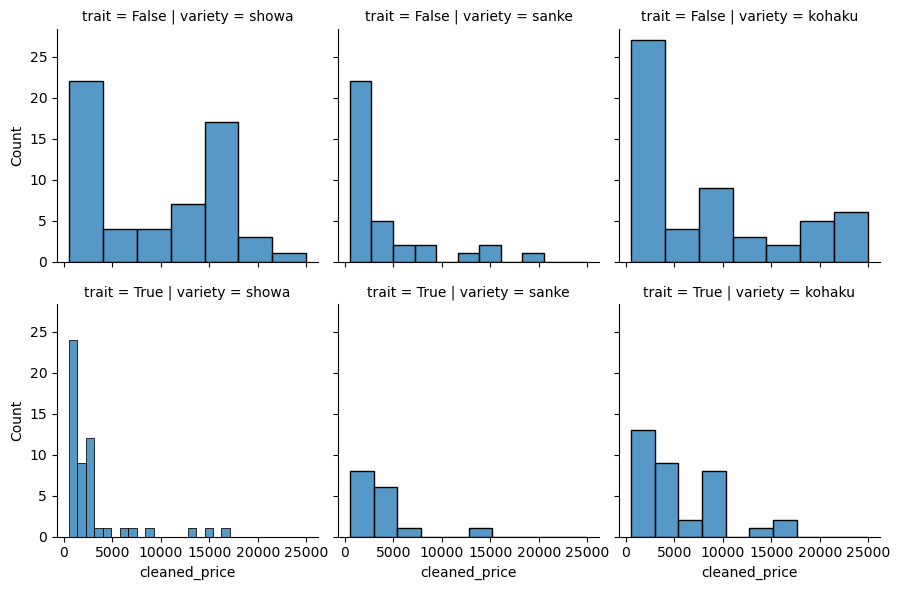

In [47]:
# How Does Having a Trait affect Distribution of Prices on Different Varieties on medium-priced fish ($500-$25,000)
display(Markdown('#### How Having a Trait affect Distribution of Prices on Different Varieties on medium-priced fish ($500-$25,000)'))
g = sns.FacetGrid(df_labeled_price, col="variety", row="trait")
g.map_dataframe(sns.histplot, x="cleaned_price", binrange=(500, 25000));

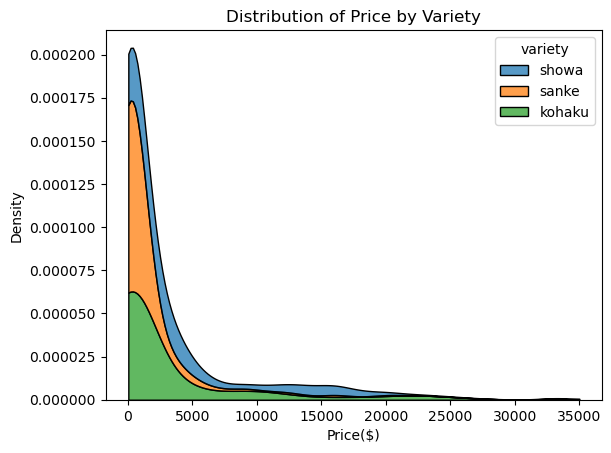

In [48]:
# Visualize the distribution of different varieties by price
sns.kdeplot(data=df_labeled_price, x="cleaned_price", hue="variety", multiple="stack",
            clip=[min(df_labeled_price['cleaned_price']), max(df_labeled_price['cleaned_price'])])
plt.title('Distribution of Price by Variety')
plt.xlabel('Price($)');

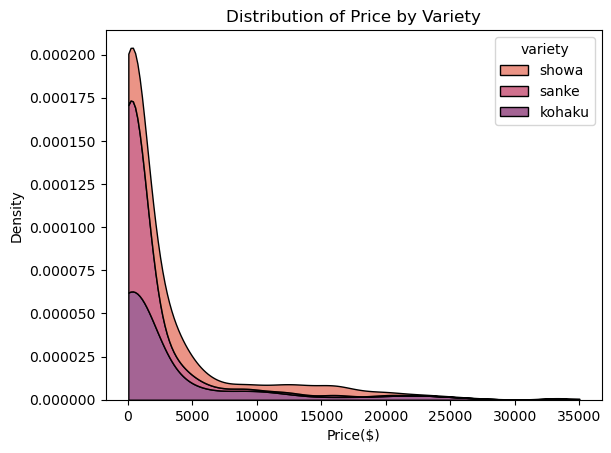

In [49]:
# Visualize the distribution of different varieties by price
sns.kdeplot(data=df_labeled_price, x="cleaned_price", hue="variety", multiple="stack", palette='flare',
            clip=[min(df_labeled_price['cleaned_price']), max(df_labeled_price['cleaned_price'])])
plt.title('Distribution of Price by Variety')
plt.xlabel('Price($)');

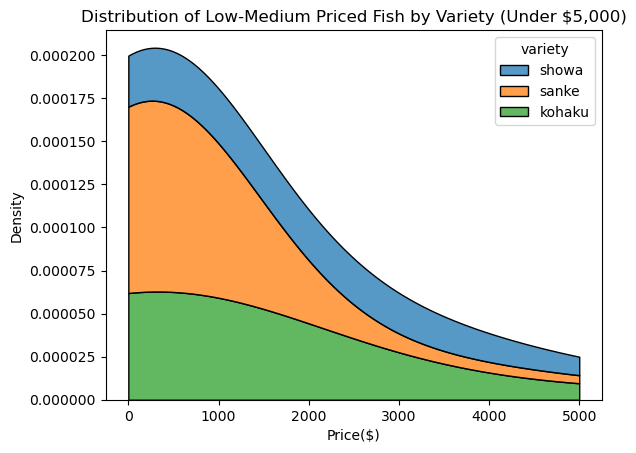

In [50]:
# Visualize the distribution of different varieties by price
sns.kdeplot(data=df_labeled_price, x="cleaned_price", hue="variety", multiple="stack",
            clip=[0, 5000])
plt.title('Distribution of Low-Medium Priced Fish by Variety (Under $5,000)')
plt.xlabel('Price($)');

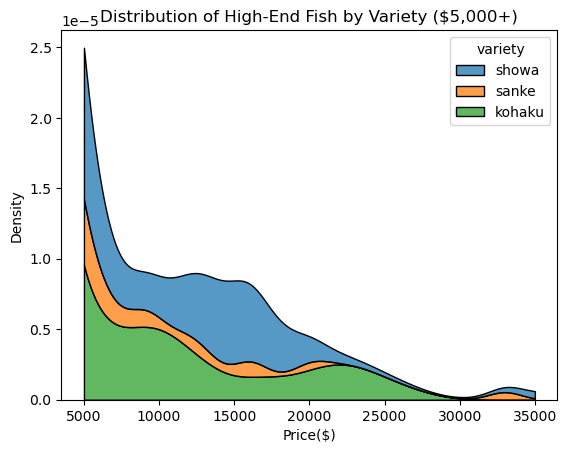

In [51]:
# Visualize the distribution of different varieties by price
sns.kdeplot(data=df_labeled_price, x="cleaned_price", hue="variety", multiple="stack",
            clip=[5000, max(df_labeled_price['cleaned_price'])])
plt.title('Distribution of High-End Fish by Variety ($5,000+)')
plt.xlabel('Price($)');

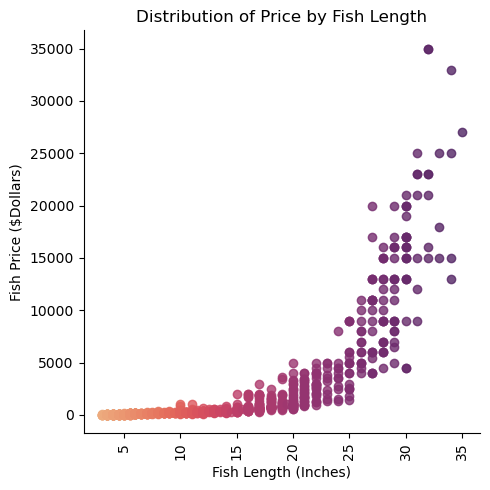

In [52]:
# Visualize the correlation between fish length and price
sns.lmplot(df, x='length', y='cleaned_price', hue='length', palette='flare', legend=False)
plt.title('Distribution of Price by Fish Length')
plt.xlabel('Fish Length (Inches)')
plt.ylabel('Fish Price ($Dollars)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('graphics/length_price_lmplot.png', transparent=True);

In [53]:
# Create a column with a string of the labels joined together
def create_label_string(list):
  return ' '.join([word.upper() for word in sorted(list)])

# Add to df
df['unique_label'] = df['multi_label'].apply(create_label_string)

# Add to df_labeled_price
df_labeled_price['unique_label'] = df_labeled_price['multi_label'].apply(create_label_string)

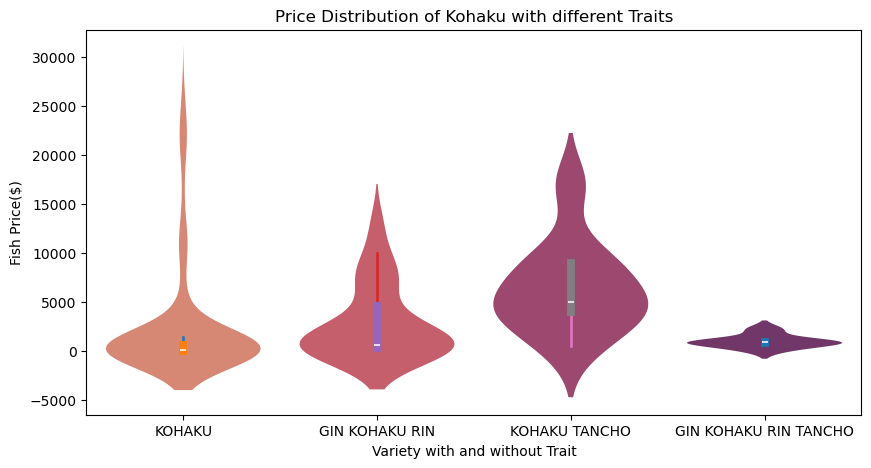

In [54]:
# Compare kohaku prices with having tancho and/or ginrin
plt.figure(figsize=(10,5))
sns.violinplot(df[df['unique_label'].isin(['KOHAKU', 'KOHAKU TANCHO', 'GIN KOHAKU RIN', 'GIN KOHAKU RIN TANCHO'])], x='unique_label', y='cleaned_price', hue='unique_label', palette='flare', edgecolor=None)
plt.title("Price Distribution of Kohaku with different Traits")
plt.xlabel('Variety with and without Trait')
plt.ylabel('Fish Price($)')
plt.savefig('graphics/price_kohaku_traits.png', transparent=True);

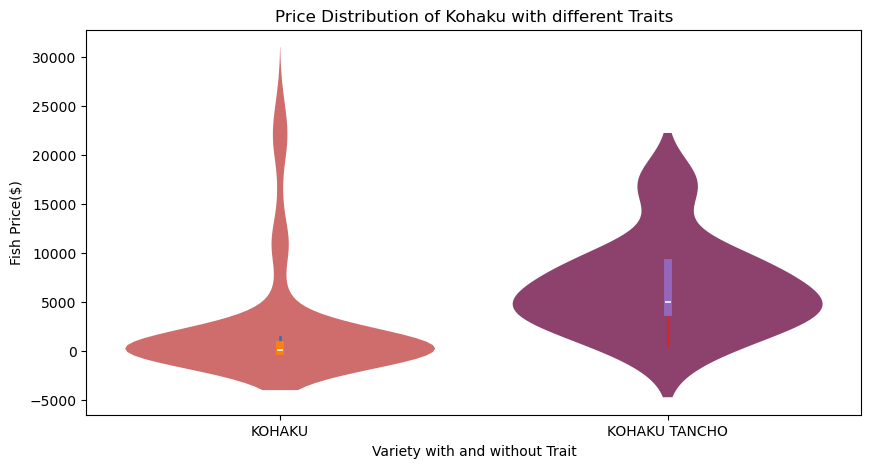

In [55]:
# Compare kohaku prices with having tancho and/or ginrin
plt.figure(figsize=(10,5))
sns.violinplot(df[df['unique_label'].isin(['KOHAKU', 'KOHAKU TANCHO'])], x='unique_label', y='cleaned_price', hue='unique_label', palette='flare', edgecolor=None)
plt.title("Price Distribution of Kohaku with different Traits")
plt.xlabel('Variety with and without Trait')
plt.ylabel('Fish Price($)')
plt.savefig('graphics/price_kohaku_traits.png', transparent=True);

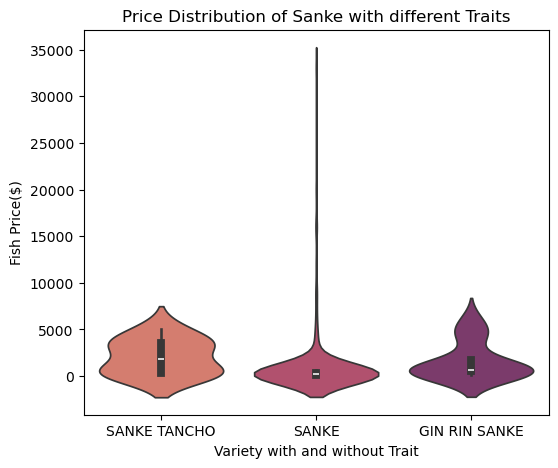

In [56]:
# Comparing sanke prices with having tancho and/or ginrin
plt.figure(figsize=(6,5))
sns.violinplot(df[df['unique_label'].isin(['SANKE', 'SANKE TANCHO', 'GIN RIN SANKE', 'GIN RIN SANKE TANCHO'])], x='unique_label', y='cleaned_price', hue='unique_label', palette='flare')
plt.title("Price Distribution of Sanke with different Traits")
plt.xlabel('Variety with and without Trait')
plt.ylabel('Fish Price($)');

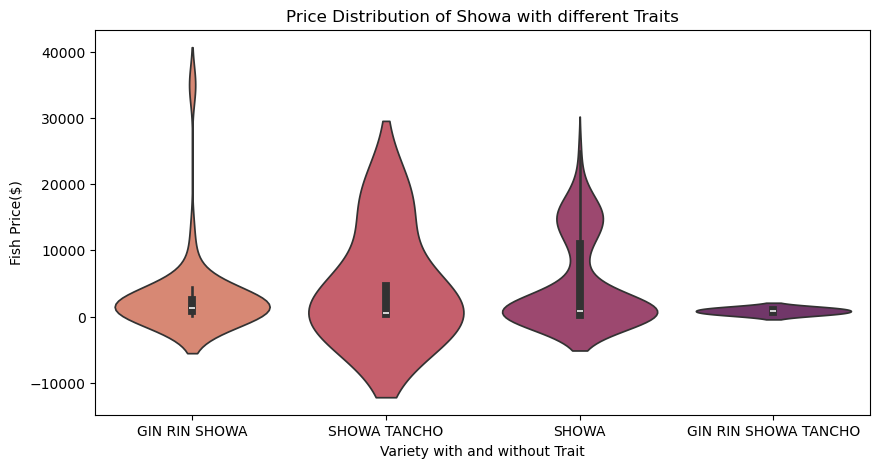

In [57]:
# Compare showa prices with having tancho and/or ginrin
plt.figure(figsize=(10,5))
sns.violinplot(df[df['unique_label'].isin(['SHOWA', 'SHOWA TANCHO', 'GIN RIN SHOWA', 'GIN RIN SHOWA TANCHO'])], x='unique_label', y='cleaned_price', hue='unique_label', palette='flare')
plt.title("Price Distribution of Showa with different Traits")
plt.xlabel('Variety with and without Trait')
plt.ylabel('Fish Price($)');

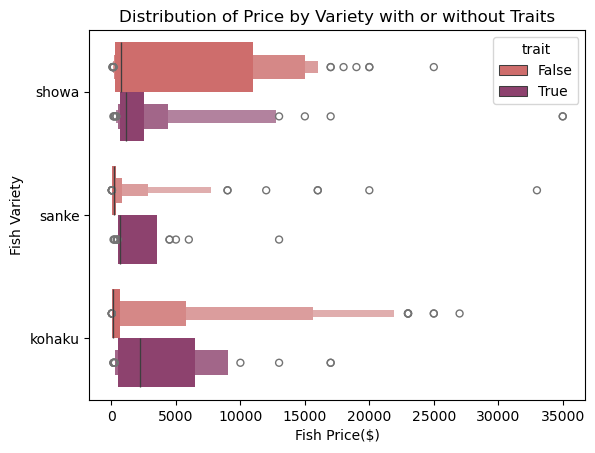

In [58]:
# Visualize the distribution of prices for the varieties with and without traits
sns.boxenplot(data=df_labeled_price, x="cleaned_price", y="variety", hue='trait', palette='flare', edgecolor=None)
plt.title('Distribution of Price by Variety with or without Traits')
plt.xlabel('Fish Price($)')
plt.ylabel('Fish Variety')
plt.savefig('graphics/dist_price_with_traits.png', transparent=True);